In [1]:
import torch
import torch.nn as nn

In [2]:
print(torch.cuda.is_available())

False


In [3]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
import os
import glob
from tqdm import tqdm
import pandas as pd
from sklearn.model_selection import train_test_split


In [4]:
def get_images(audio_file):
    samples, sr = librosa.load(audio_file)
    S = librosa.feature.melspectrogram(y=samples,
                                       sr=sr,
                                       fmax=1024)
    S_db = librosa.power_to_db(S, ref=np.max)
    return S_db

In [7]:
df = pd.read_csv('data/train.csv')

In [8]:
df.head()

,clip_name,label
0,train1.aiff,0
1,train2.aiff,0
2,train3.aiff,0
3,train4.aiff,0
4,train5.aiff,0


In [13]:
# Use TPU accelerator
DEVICE = "TPU" #or "GPU"

# Batch size 
BATCH_SIZE = 16 * 8 #Batch size 16 * 8 Replicas

# Seed value for reproducibility
SEED = 29

# Images size
IMG_SIZES = [[255, 255]]

# Total number of epochs
EPOCHS = [12]

# Augment and transform images 
AUGMENT   = True
TRANSFORM = True

# Transormations parameters
ROT_    = 0.0
SHR_    = 2.0
HZOOM_  = 8.0
WZOOM_  = 8.0
HSHIFT_ = 8.0
WSHIFT_ = 8.0

In [15]:
# input_folder = "data/train/"
# X = torch.Tensor(np.array([np.array([get_images(input_folder + clip_name) for clip_name in tqdm(df['clip_name'], desc='Files')])]))

In [17]:
# torch.save(X, 'spectrograms.tensor')

In [110]:
X = torch.load("spectrograms.tensor")

C:\Users\1078620\AppData\Local\Temp\ipykernel_19092\3889665704.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  X = torch.load("spectrograms.tensor")


In [112]:
X.shape

torch.Size([1, 30000, 128, 87])

In [23]:
y = df['label']

In [25]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, AveragePooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras import layers, models
from tensorflow.keras.applications import ResNet50


In [26]:
# Defining binary focal loss function
def binary_focal_loss(gamma = 2., alpha = .25):
    def tf_binary_focal_loss_fixed(y_true, y_pred):
         pt_1 = tf.where(tf.equal(y_true, 1), y_pred, tf.ones_like(y_pred))
         pt_0 = tf.where(tf.equal(y_true, 0), y_pred, tf.zeros_like(y_pred))
         epsilon = K.epsilon()
         pt_1 = K.clip(pt_1, epsilon, 1. - epsilon)
         pt_0 = K.clip(pt_0, epsilon, 1. - epsilon)
         return -K.sum(alpha * K.pow(1. - pt_1, gamma) * K.log(pt_1)) -K.sum((1 - alpha) * K.pow(pt_0, gamma) * K.log(1. - pt_0))
    return tf_binary_focal_loss_fixed

In [27]:
def exponential_lr(epoch,
                   start_lr = 0.00001, min_lr = 0.00001, max_lr = 0.00005,
                   rampup_epochs = 5, sustain_epochs = 0,
                   exp_decay = 0.85):

    def lr(epoch, start_lr, min_lr, max_lr, rampup_epochs, sustain_epochs, exp_decay):
        # linear increase from start to rampup_epochs
        if epoch < rampup_epochs:
            lr = ((max_lr - start_lr) /
                  rampup_epochs * epoch + start_lr)
        # constant max_lr during sustain_epochs
        elif epoch < rampup_epochs + sustain_epochs:
            lr = max_lr
        # exponential decay towards min_lr
        else:
            lr = ((max_lr - min_lr) *
                  exp_decay**(epoch - rampup_epochs - sustain_epochs) +
                  min_lr)
        return lr
    return lr(epoch,
              start_lr,
              min_lr,
              max_lr,
              rampup_epochs,
              sustain_epochs,
              exp_decay)

lr_callback = tf.keras.callbacks.LearningRateScheduler(exponential_lr, verbose=True)

In [28]:
# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=2, restore_best_weights=True)

In [29]:
X_train, X_test, y_train, y_test = train_test_split(
  X[0],y , random_state=42,test_size=0.25, shuffle=True)

In [35]:
model = Sequential([
    Conv2D(16, kernel_size=(3, 3), activation='relu', input_shape=(128, 87, 1)),
    AveragePooling2D((2, 2)),
    Conv2D(32, kernel_size=(3, 3), activation='relu'),
    AveragePooling2D((2, 2)),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    AveragePooling2D((2, 2)),
    Conv2D(128, kernel_size=(5, 5), activation='relu'),
    Conv2D(256, kernel_size=(5, 5), activation='relu'),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

C:\Users\1078620\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [37]:
model.compile(
    optimizer='adam',
    loss=binary_focal_loss(),
    metrics=['binary_accuracy'],
)

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 85, 16)         │             160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d (AveragePooling2D) │ (None, 63, 42, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 40, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_1                  │ (None, 30, 20, 32)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 18, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_2                  │ (None, 14, 9, 64)           │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 10, 5, 128)          │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 6, 1, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,088,897 (4.15 MB)

 Trainable params: 1,088,897 (4.15 MB)

 Non-trainable params: 0 (0.00 B)

In [39]:
X_train.shape

torch.Size([22500, 128, 87])

In [41]:
early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=2, restore_best_weights=True)

In [43]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Define the ModelCheckpoint callback
checkpoint_callback = ModelCheckpoint(
    filepath='best_model.h5',          # Filepath to save the best model
    monitor='val_binary_accuracy',    # Monitor validation binary accuracy
    save_best_only=True,              # Save only the model with the best performance
    mode='max',                       # Maximize the monitored metric
    verbose=1                         # Print updates during training
)


In [45]:
import tensorflow as tf

# # Ensure the model uses GPU
with tf.device('/GPU:0'):
    history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=3, batch_size=32, callbacks=[lr_callback,early_stopping])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/3
704/704 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step - binary_accuracy: 0.7578 - loss: 2.0557 - val_binary_accuracy: 0.7861 - val_loss: 0.9542 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0008100000379979611.
Epoch 2/3
704/704 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - binary_accuracy: 0.8475 - loss: 0.8295 - val_binary_accuracy: 0.8972 - val_loss: 0.6720 - learning_rate: 8.1000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005060000335611404.
Epoch 3/3
704/704 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step - binary_accuracy: 0.8986 - loss: 0.6562 - val_binary_accuracy: 0.8692 - val_loss: 0.6573 - learning_rate: 5.0600e-04


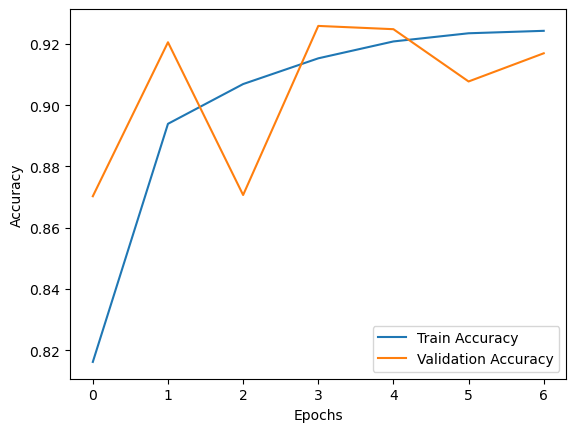

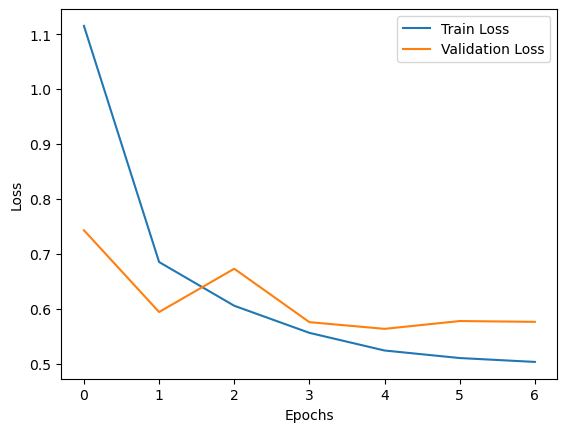

In [53]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history.history['binary_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_binary_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


235/235 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


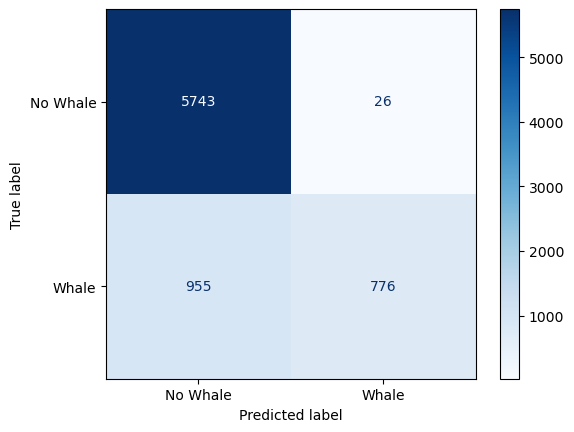

In [47]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Predict probabilities
y_pred_probs = model.predict(X_test)

# Convert probabilities to binary predictions (threshold = 0.5)
y_pred = (y_pred_probs > 0.5).astype(int)

# Generate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No Whale', 'Whale'])
disp.plot(cmap='Blues')


235/235 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step


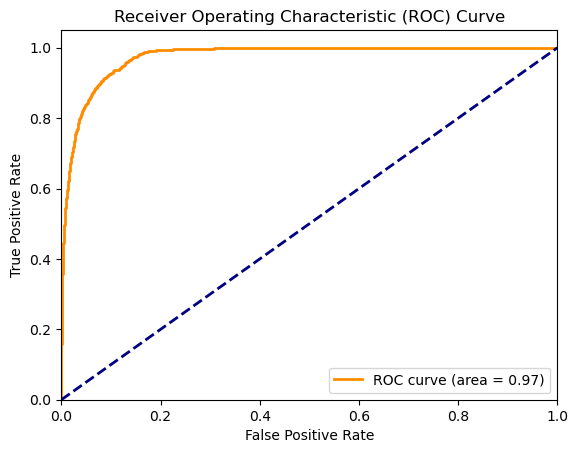

In [48]:
from sklearn.metrics import roc_curve, auc


# Predict probabilities (not labels) for the test data
y_prob = model.predict(X_test)

# Compute ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, y_prob)
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

235/235 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


C:\Users\1078620\AppData\Local\Temp\ipykernel_19092\1931453169.py:17: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(whale_probabilities.flatten(), label="Right Whale", shade=True)
C:\Users\1078620\AppData\Local\Temp\ipykernel_19092\1931453169.py:18: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(non_whale_probabilities.flatten(), label="Non-Whale", shade=True)


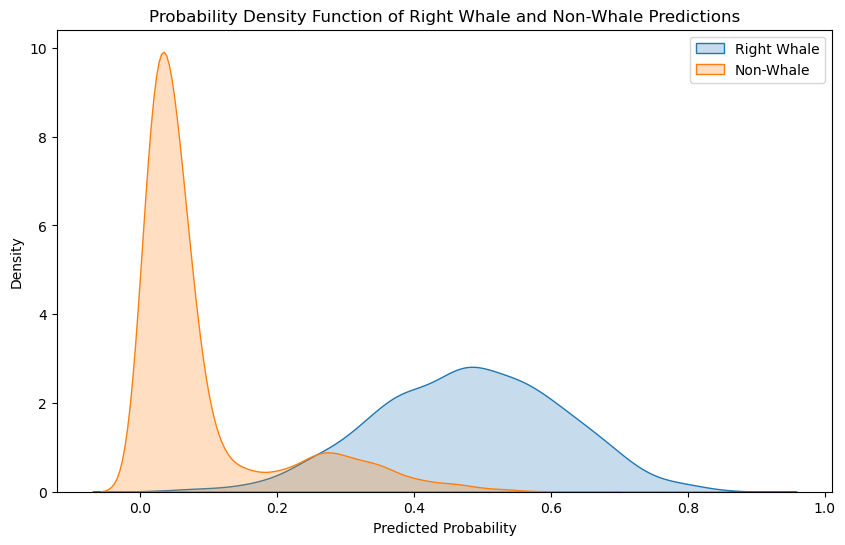

In [49]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assume 'model' is your trained model and 'X_test' is your test data
# Make predictions (get probabilities for each class)
predictions = model.predict(X_test)  # predictions will have shape (num_samples, 1)

# Let's say you have binary labels (0 for non-whale, 1 for whale)
# For demonstration, let's assume 'y_test' are the true labels for the test set
# Separate the predicted probabilities based on the true labels
whale_probabilities = predictions[y_test == 1]
non_whale_probabilities = predictions[y_test == 0]

# Plot the Probability Density Function (PDF)
plt.figure(figsize=(10, 6))
sns.kdeplot(whale_probabilities.flatten(), label="Right Whale", shade=True)
sns.kdeplot(non_whale_probabilities.flatten(), label="Non-Whale", shade=True)

plt.title("Probability Density Function of Right Whale and Non-Whale Predictions")
plt.xlabel("Predicted Probability")
plt.ylabel("Density")
plt.legend()
plt.show()


235/235 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


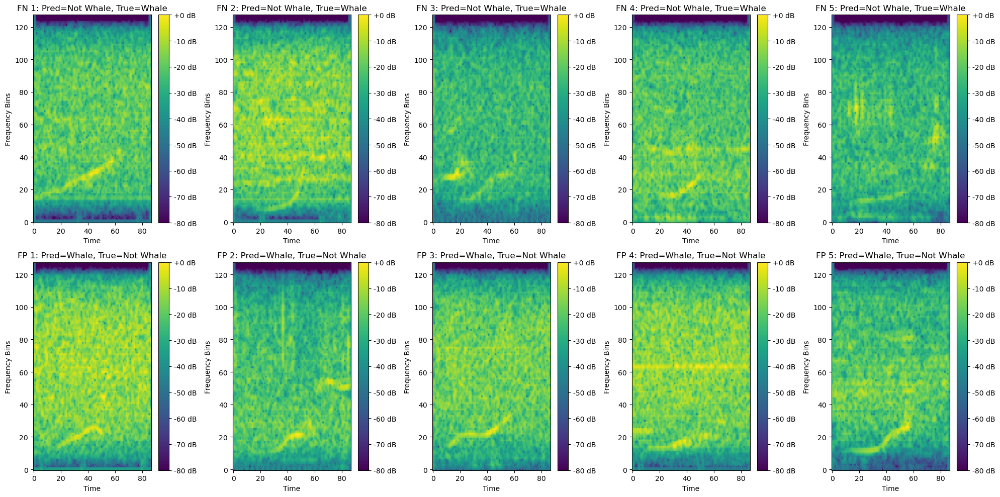

In [50]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Get predictions for the test set
predictions = model.predict(X_test)  # Assuming X_test is your test set
predicted_labels = (predictions > 0.5).astype(int)  # Convert probabilities to binary labels

# True labels for the test set
true_labels = y_test  # Assuming y_test contains the true labels

# Identify false negatives and false positives
false_negatives = np.where((predicted_labels.flatten() == 0) & (true_labels == 1))[0]
false_positives = np.where((predicted_labels.flatten() == 1) & (true_labels == 0))[0]

# Randomly select 5 false negatives and 5 false positives
selected_fn = random.sample(list(false_negatives), 5)  # Randomly select 5 false negatives
selected_fp = random.sample(list(false_positives), 5)  # Randomly select 5 false positives

# Create a figure to plot the spectrograms
fig, axes = plt.subplots(2, 5, figsize=(20, 10))  # Two rows, five columns
axes = axes.flatten()

# Plot false negatives
for i, fn_idx in enumerate(selected_fn):
    spectrogram = X_test[fn_idx]  # Get spectrogram for the false negative
    ax = axes[i]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    ax.set_title(f'FN {i+1}: Pred=Not Whale, True=Whale')
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

# Plot false positives (starting from the 6th plot)
for i, fp_idx in enumerate(selected_fp):
    spectrogram = X_test[fp_idx]  # Get spectrogram for the false positive
    ax = axes[i + 5]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    ax.set_title(f'FP {i+1}: Pred=Whale, True=Not Whale')
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

plt.tight_layout()
plt.show()

In [77]:
pip install tensorflow_probability

   ---------------------------------------- 0.0/7.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/7.0 MB 1.4 MB/s eta 0:00:06
   -- ------------------------------------- 0.5/7.0 MB 5.9 MB/s eta 0:00:02
   ------- -------------------------------- 1.3/7.0 MB 10.0 MB/s eta 0:00:01
   ------------ --------------------------- 2.2/7.0 MB 12.8 MB/s eta 0:00:01
   ------------------ --------------------- 3.3/7.0 MB 16.2 MB/s eta 0:00:01
   ----------------------- ---------------- 4.1/7.0 MB 15.6 MB/s eta 0:00:01
   ------------------------------ --------- 5.3/7.0 MB 17.9 MB/s eta 0:00:01
   ----------------------------------- ---- 6.2/7.0 MB 18.1 MB/s eta 0:00:01
   ---------------------------------------  7.0/7.0 MB 17.9 MB/s eta 0:00:01
   ---------------------------------------- 7.0/7.0 MB 17.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/101.3 kB ? eta -:--:--
   ---------------------------------------- 101.3/101.3 kB 5.7 MB/s eta 0:00:00
Note: you ma

In [83]:
X_train

tensor([[[-30.6822, -42.0836, -41.0012,  ..., -40.4331, -30.1156, -23.9669],
         [-30.4966, -30.2784, -33.1559,  ..., -28.2008, -23.1152, -20.2887],
         [-29.8065, -26.4392, -29.5706,  ..., -24.3461, -19.6248, -17.4715],
         ...,
         [-61.3951, -67.8994, -80.0000,  ..., -80.0000, -47.5838, -39.1267],
         [-62.1858, -68.5864, -80.0000,  ..., -80.0000, -48.4720, -40.0905],
         [-62.4480, -68.7657, -80.0000,  ..., -80.0000, -48.8471, -40.5232]],

        [[-42.0672, -44.9071, -47.5801,  ..., -51.8264, -50.4450, -45.3198],
         [-40.0294, -41.1968, -50.1020,  ..., -50.3546, -51.4170, -45.8359],
         [-37.8870, -38.3696, -69.2825,  ..., -48.5480, -52.5937, -46.1182],
         ...,
         [-58.3294, -65.1804, -80.0000,  ..., -80.0000, -73.5292, -64.5324],
         [-59.0130, -65.9137, -80.0000,  ..., -80.0000, -74.3070, -65.3005],
         [-59.1976, -66.0776, -80.0000,  ..., -80.0000, -74.5783, -65.5736]],

        [[-45.3204, -38.6447, -36.6468,  ...

In [55]:
import tensorflow as tf
import tensorflow_probability as tfp

def increase_contrast(image, lower_percentile=2, upper_percentile=98):
    """
    Increase contrast by stretching the pixel value range.
    The lower and upper percentiles define the range for contrast stretching.
    """
    # Compute the lower and upper bounds for the image's pixel value using TensorFlow Probability
    lower_bound = tfp.stats.percentile(image, lower_percentile, axis=[1, 2], keepdims=True)
    upper_bound = tfp.stats.percentile(image, upper_percentile, axis=[1, 2], keepdims=True)

    # Stretch the pixel values
    contrast_enhanced = (image - lower_bound) / (upper_bound - lower_bound)
    contrast_enhanced = tf.clip_by_value(contrast_enhanced, 0.0, 1.0)

    return contrast_enhanced

# Example: Apply contrast enhancement to your spectrograms (assuming X_train is a tensor)
X_contrasted = increase_contrast(X)

# To confirm the shape of the result and ensure proper contrast enhancement:
print(X_contrasted.shape)





(1, 30000, 128, 87)


In [87]:
pip install tensorflow-probability


Note: you may need to restart the kernel to use updated packages.


In [89]:
pip install tf-keras


   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   -- ------------------------------------- 0.1/1.7 MB 1.3 MB/s eta 0:00:02
   ------------ --------------------------- 0.5/1.7 MB 4.7 MB/s eta 0:00:01
   ----------------------- ---------------- 1.0/1.7 MB 6.3 MB/s eta 0:00:01
   ---------------------------------------  1.7/1.7 MB 8.4 MB/s eta 0:00:01
   ---------------------------------------- 1.7/1.7 MB 7.8 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


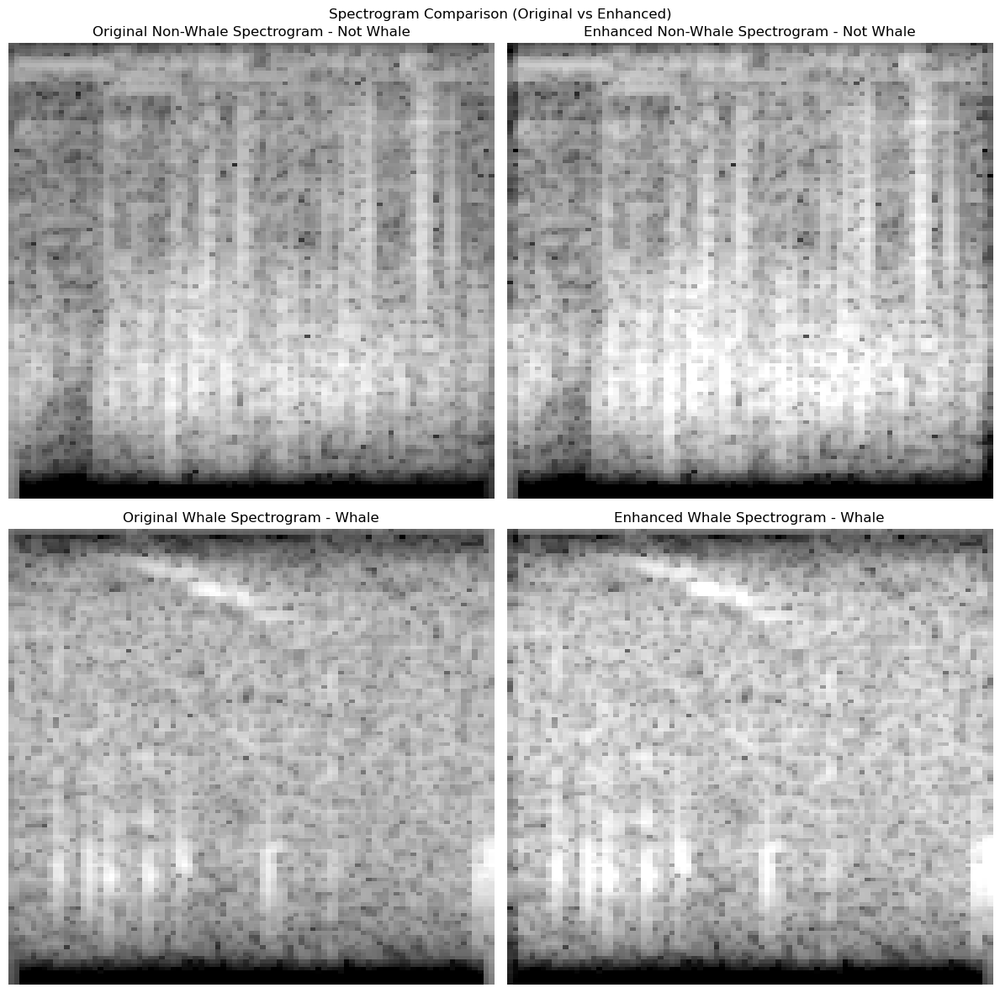

In [67]:
import numpy as np
import matplotlib.pyplot as plt

# Function to visualize the comparison between the original and enhanced spectrograms
def plot_comparison_original_vs_enhanced(originals, enhanced, labels, title='Spectrogram Comparison (Original vs Enhanced)'):
    # Select random indices for one non-whale and one whale spectrogram
    whale_idx = np.random.choice(np.where(labels == 1)[0])  # Index of a whale
    non_whale_idx = np.random.choice(np.where(labels == 0)[0])  # Index of a non-whale
    
    # Create a figure for visualization
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    
    # Display original non-whale spectrogram
    axes[0, 0].imshow(originals[non_whale_idx], cmap='gray', aspect='auto')
    axes[0, 0].set_title(f'Original Non-Whale Spectrogram - {"Whale" if labels[non_whale_idx] == 1 else "Not Whale"}')
    axes[0, 0].axis('off')
    
    # Display enhanced non-whale spectrogram
    axes[0, 1].imshow(enhanced[non_whale_idx], cmap='gray', aspect='auto')
    axes[0, 1].set_title(f'Enhanced Non-Whale Spectrogram - {"Whale" if labels[non_whale_idx] == 1 else "Not Whale"}')
    axes[0, 1].axis('off')
    
    # Display original whale spectrogram
    axes[1, 0].imshow(originals[whale_idx], cmap='gray', aspect='auto')
    axes[1, 0].set_title(f'Original Whale Spectrogram - {"Whale" if labels[whale_idx] == 1 else "Not Whale"}')
    axes[1, 0].axis('off')
    
    # Display enhanced whale spectrogram
    axes[1, 1].imshow(enhanced[whale_idx], cmap='gray', aspect='auto')
    axes[1, 1].set_title(f'Enhanced Whale Spectrogram - {"Whale" if labels[whale_idx] == 1 else "Not Whale"}')
    axes[1, 1].axis('off')
    
    # Set main title
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Assuming X_train contains your original spectrograms and y_train contains the labels
# Convert tensors to numpy for visualization
original_spectrograms = X[0].numpy()  # Assuming X_train is the tensor of original spectrograms
enhanced_spectrograms = X_contrasted[0].numpy()  # Assuming you have the enhanced version
labels = y.values  # Convert the pandas Series to a numpy array

# Plot comparison of original vs enhanced spectrograms
plot_comparison_original_vs_enhanced(original_spectrograms, enhanced_spectrograms, labels)


In [78]:
X_train, X_test, y_train, y_test = train_test_split(
  np.array(X_contrasted[0]),y , random_state=42,test_size=0.25, shuffle=True)

In [80]:
model2 = Sequential([
    Conv2D(16, kernel_size=(3, 3), activation='relu', input_shape=(128, 87, 1)),
    AveragePooling2D((2, 2)),
    Conv2D(32, kernel_size=(3, 3), activation='relu'),
    AveragePooling2D((2, 2)),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    AveragePooling2D((2, 2)),
    Conv2D(128, kernel_size=(5, 5), activation='relu'),
    Conv2D(256, kernel_size=(5, 5), activation='relu'),
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='sigmoid')
])

model2.compile(
    optimizer='adam',
    loss=binary_focal_loss(),
    metrics=['binary_accuracy'],
)

model2.summary()

C:\Users\1078620\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 126, 85, 16)         │             160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_3                  │ (None, 63, 42, 16)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 61, 40, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_4                  │ (None, 30, 20, 32)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 18, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_5                  │ (None, 14, 9, 64)           │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 10, 5, 128)          │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 6, 1, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,088,897 (4.15 MB)

 Trainable params: 1,088,897 (4.15 MB)

 Non-trainable params: 0 (0.00 B)

In [82]:
import tensorflow as tf

# # Ensure the model uses GPU
with tf.device('/GPU:0'):
    history = model2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=3, batch_size=32, callbacks=[lr_callback,early_stopping])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/3
704/704 ━━━━━━━━━━━━━━━━━━━━ 48s 65ms/step - binary_accuracy: 0.7667 - loss: 1.7806 - val_binary_accuracy: 0.7692 - val_loss: 1.5459 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0008100000379979611.
Epoch 2/3
704/704 ━━━━━━━━━━━━━━━━━━━━ 42s 60ms/step - binary_accuracy: 0.7672 - loss: 1.3761 - val_binary_accuracy: 0.7692 - val_loss: 1.1338 - learning_rate: 8.1000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005060000335611404.
Epoch 3/3
704/704 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step - binary_accuracy: 0.7976 - loss: 1.0127 - val_binary_accuracy: 0.8648 - val_loss: 0.8596 - learning_rate: 5.0600e-04


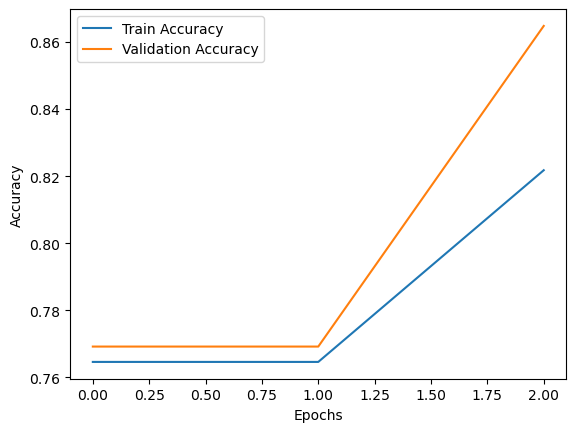

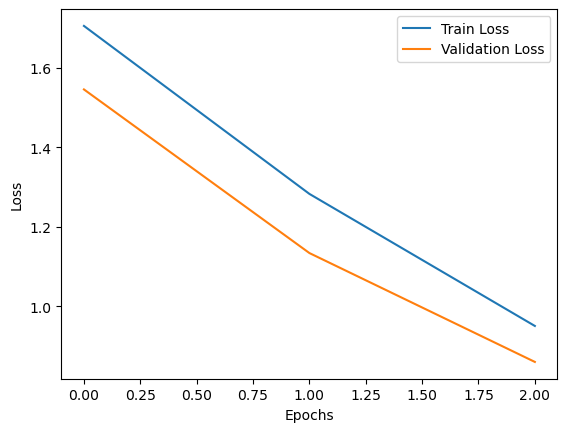

In [84]:
import matplotlib.pyplot as plt

# Plot training and validation accuracy
plt.plot(history.history['binary_accuracy'], label='Train Accuracy')
plt.plot(history.history['val_binary_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [144]:
import torch
import torch.nn.functional as F

def gaussian_kernel(kernel_size: int, sigma: float):
    """
    Generates a 2D Gaussian kernel.
    """
    kernel = torch.arange(-(kernel_size // 2), kernel_size // 2 + 1).float()
    kernel = torch.exp(-0.5 * (kernel / sigma) ** 2)
    kernel = kernel / kernel.sum()  # Normalize kernel

    kernel_2d = kernel.view(-1, 1) @ kernel.view(1, -1)  # Create 2D Gaussian kernel
    return kernel_2d

def apply_gaussian_smoothing(X, kernel_size=5, sigma=1.0):
    """
    Apply Gaussian smoothing to a tensor of spectrograms.
    """
    # Generate the Gaussian kernel
    kernel = gaussian_kernel(kernel_size, sigma).unsqueeze(0).unsqueeze(0)
    
    # Add batch and channel dimensions to the kernel
    kernel = kernel.expand(1, 1, kernel_size, kernel_size)  # Shape: [1, 1, kernel_size, kernel_size]
    
    # Permute the input tensor to match the expected format for conv2d:
    # [batch, channels, height, width] -> [batch, 1, height, width]
    # In your case, we have [1, 30000, 128, 87], so we need to treat 30000 spectrograms as independent samples.
    
    X = X.view(-1, 1, X.shape[2], X.shape[3])  # Flatten the 30000 spectrograms into separate inputs [30000, 1, 128, 87]
    
    # Apply convolution with the Gaussian kernel
    smoothed_X = F.conv2d(X, kernel, padding=kernel_size // 2, groups=1)
    
    # Reshape back to the original batch size and spectrogram count
    smoothed_X = smoothed_X.view(1, 30000, X.shape[2], X.shape[3])  # Shape: [1, 30000, 128, 87]
    
    return smoothed_X

# Example usage:
smoothed_X = apply_gaussian_smoothing(X)


In [154]:
import torch
import torch.nn.functional as F

def moving_average_smoothing(X, kernel_size=5):
    """
    Apply moving average smoothing to a tensor of spectrograms.
    """
    # Create a uniform kernel for moving average
    kernel = torch.ones(1, 1, kernel_size, kernel_size) / (kernel_size * kernel_size)  # Shape: [1, 1, kernel_size, kernel_size]
    
    # Reshape the input tensor to [batch_size * spectrograms, 1, height, width]
    X = X.view(-1, 1, X.shape[2], X.shape[3])  # Flatten the 30000 spectrograms into separate inputs [30000, 1, 128, 87]
    
    # Apply convolution to each spectrogram independently
    smoothed_X = F.conv2d(X, kernel, padding=kernel_size // 2, groups=1)
    
    # Reshape back to the original shape [1, 30000, 128, 87]
    smoothed_X = smoothed_X.view(1, 30000, X.shape[2], X.shape[3])  # Shape: [1, 30000, 128, 87]
    
    return smoothed_X

# Example usage:
average_X = moving_average_smoothing(X)


In [166]:
import torch

def contrast_stretching(X, min_val=0, max_val=1):
    """
    Apply contrast stretching to a tensor of spectrograms.
    """
    # Flatten the spectrogram to find the global min and max values
    min_input = X.min()
    max_input = X.max()

    # Perform contrast stretching
    stretched_X = (X - min_input) / (max_input - min_input)  # Normalize to [0, 1]
    stretched_X = stretched_X * (max_val - min_val) + min_val  # Scale to [min_val, max_val]

    return stretched_X

# Example usage:
enhanced_X = contrast_stretching(X)

In [170]:
import torch
import numpy as np

def histogram_equalization(X):
    """
    Apply histogram equalization to a tensor of spectrograms.
    """
    # Reshape X to 2D to simplify the histogram computation
    batch_size, num_spectrograms, height, width = X.shape
    X_flattened = X.view(-1)

    # Compute the histogram
    hist = torch.histc(X_flattened, bins=256, min=X_flattened.min(), max=X_flattened.max())

    # Compute the cumulative distribution function (CDF)
    cdf = hist.cumsum(0)
    cdf = (cdf - cdf.min()) / (cdf.max() - cdf.min())  # Normalize CDF to [0, 1]

    # Map the pixel values based on the CDF
    X_equalized = cdf[(X_flattened - X_flattened.min()).long()] * (X_flattened.max() - X_flattened.min()) + X_flattened.min()
    
    # Reshape back to the original size
    X_equalized = X_equalized.view(batch_size, num_spectrograms, height, width)

    return X_equalized

# Example usage:
equalized_X = histogram_equalization(X)


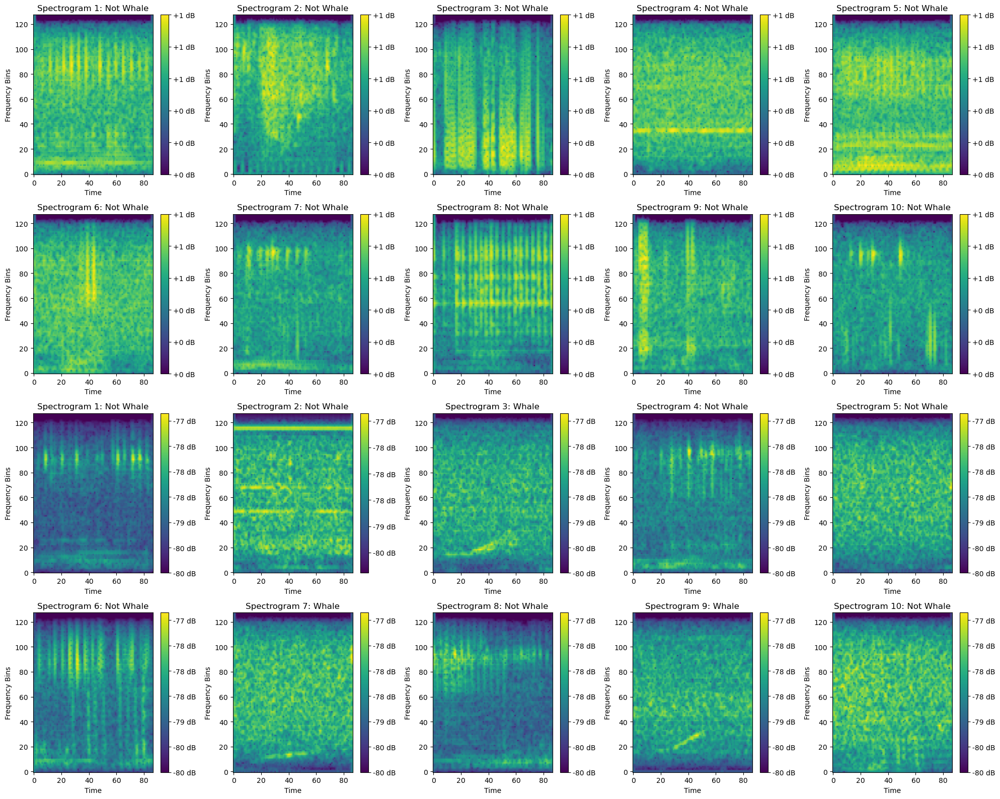

In [174]:
import random
import matplotlib.pyplot as plt

# Create a figure with 4 rows and 5 columns of subplots
fig, axes = plt.subplots(4, 5, figsize=(20, 16))  # Adjust figsize for better visibility

axes = axes.flatten()

for i in range(10):
    id = random.randint(0, 5000)  # Random index for selecting a sample
    spectrogram = enhanced_X[0, id]  # Assuming X is a tensor with shape [1, n_samples, ...]
    ax = axes[i]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    
    if y[id] == 1:
        ax.set_title(f'Spectrogram {i+1}: Whale')
    else:
        ax.set_title(f'Spectrogram {i+1}: Not Whale')
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

for i in range(10):
    id = random.randint(0, 5000)  # Random index for selecting a sample
    spectrogram = equalized_X[0, id]  # Assuming X is a tensor with shape [1, n_samples, ...]
    ax = axes[i+10]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    
    if y[id] == 1:
        ax.set_title(f'Spectrogram {i+1}: Whale')
    else:
        ax.set_title(f'Spectrogram {i+1}: Not Whale')
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

plt.tight_layout()
plt.show()

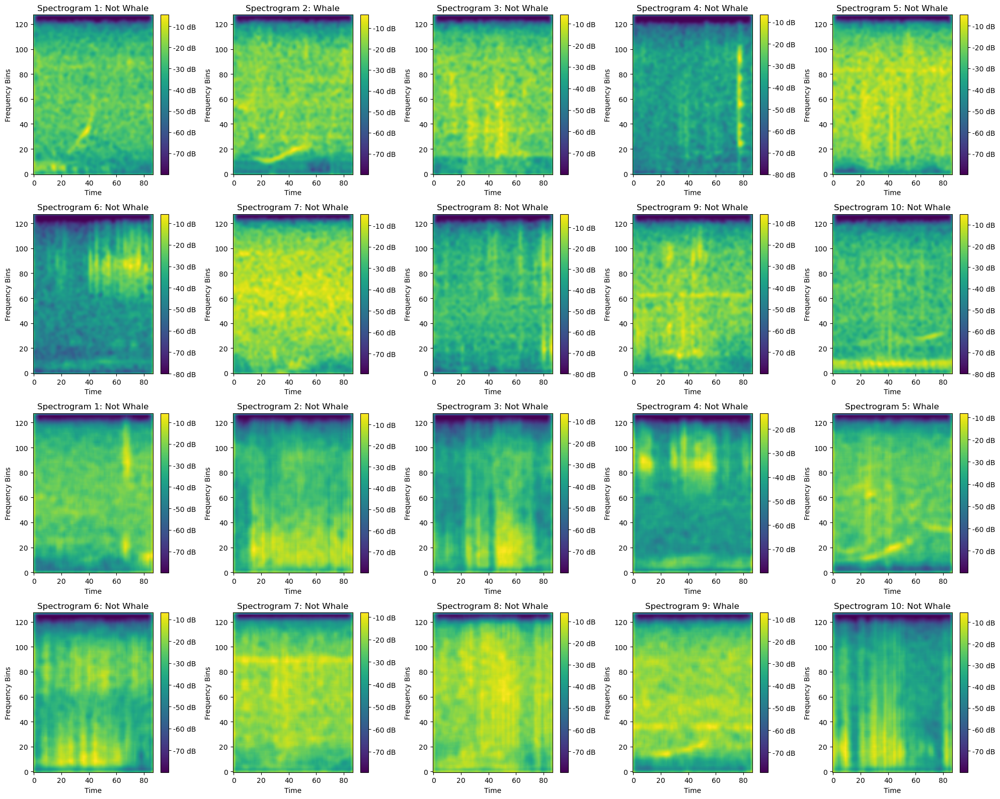

In [164]:
import random
import matplotlib.pyplot as plt

# Create a figure with 4 rows and 5 columns of subplots
fig, axes = plt.subplots(4, 5, figsize=(20, 16))  # Adjust figsize for better visibility

axes = axes.flatten()

for i in range(10):
    id = random.randint(0, 5000)  # Random index for selecting a sample
    spectrogram = smoothed_X[0, id]  # Assuming X is a tensor with shape [1, n_samples, ...]
    ax = axes[i]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    
    if y[id] == 1:
        ax.set_title(f'Spectrogram {i+1}: Whale')
    else:
        ax.set_title(f'Spectrogram {i+1}: Not Whale')
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

for i in range(10):
    id = random.randint(0, 5000)  # Random index for selecting a sample
    spectrogram = average_X[0, id]  # Assuming X is a tensor with shape [1, n_samples, ...]
    ax = axes[i+10]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    
    if y[id] == 1:
        ax.set_title(f'Spectrogram {i+1}: Whale')
    else:
        ax.set_title(f'Spectrogram {i+1}: Not Whale')
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

plt.tight_layout()
plt.show()

IndexError: index 19704 is out of bounds for axis 0 with size 1

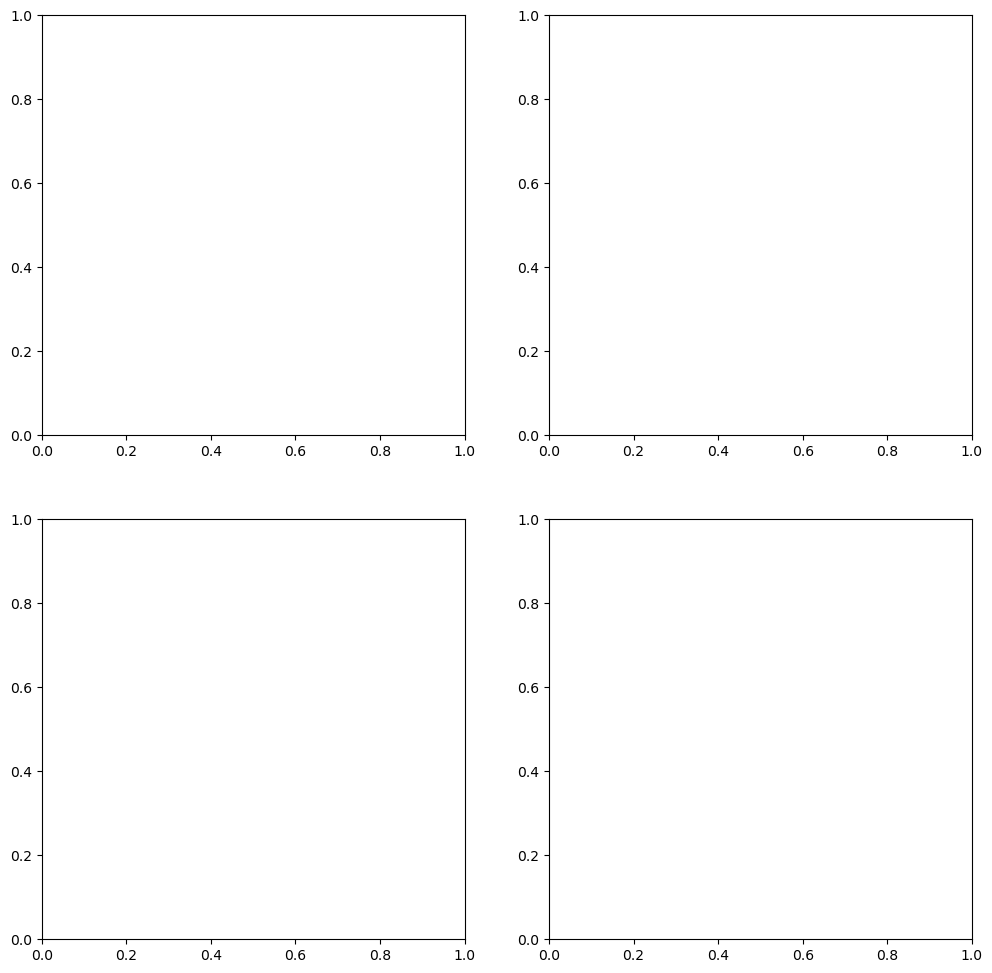

In [204]:
import numpy as np
import matplotlib.pyplot as plt

# Function to visualize the comparison between the original and enhanced spectrograms
def plot_comparison_original_vs_enhanced(originals, enhanced, labels, title='Spectrogram Comparison (Original vs Enhanced)'):
    # Select random indices for one non-whale and one whale spectrogram
    whale_idx = np.random.choice(np.where(labels == 1)[0])  # Index of a whale
    non_whale_idx = np.random.choice(np.where(labels == 0)[0])  # Index of a non-whale
    
    # Create a figure for visualization
    fig, axes = plt.subplots(2, 2, figsize=(12, 12))
    
    # Display original non-whale spectrogram
    axes[0, 0].imshow(originals[non_whale_idx], cmap='gray', aspect='auto')
    axes[0, 0].set_title(f'Original Non-Whale Spectrogram - {"Whale" if labels[non_whale_idx] == 1 else "Not Whale"}')
    axes[0, 0].axis('off')
    
    # Display enhanced non-whale spectrogram
    axes[0, 1].imshow(enhanced[non_whale_idx], cmap='gray', aspect='auto')
    axes[0, 1].set_title(f'Enhanced Non-Whale Spectrogram - {"Whale" if labels[non_whale_idx] == 1 else "Not Whale"}')
    axes[0, 1].axis('off')
    
    # Display original whale spectrogram
    axes[1, 0].imshow(originals[whale_idx], cmap='gray', aspect='auto')
    axes[1, 0].set_title(f'Original Whale Spectrogram - {"Whale" if labels[whale_idx] == 1 else "Not Whale"}')
    axes[1, 0].axis('off')
    
    # Display enhanced whale spectrogram
    axes[1, 1].imshow(enhanced[whale_idx], cmap='gray', aspect='auto')
    axes[1, 1].set_title(f'Enhanced Whale Spectrogram - {"Whale" if labels[whale_idx] == 1 else "Not Whale"}')
    axes[1, 1].axis('off')
    
    # Set main title
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Assuming X_train contains your original spectrograms and y_train contains the labels
# Convert tensors to numpy for visualization
original_spectrograms = X_train.numpy()  # Assuming X_train is the tensor of original spectrograms
enhanced_spectrograms = X_train_contrasted.numpy()  # Assuming you have the enhanced version
labels = y_train.values  # Convert the pandas Series to a numpy array

# Plot comparison of original vs enhanced spectrograms
plot_comparison_original_vs_enhanced(original_spectrograms, enhanced_spectrograms, labels)


In [228]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(
  np.array(enhanced_X[0]),y , random_state=42,test_size=0.25, shuffle=True)

In [240]:
model3 = Sequential([
    Conv2D(16, kernel_size=(3, 3), activation='relu', input_shape=(128, 87, 1)),
    AveragePooling2D((2, 2)),
    Conv2D(32, kernel_size=(3, 3), activation='relu'),
    AveragePooling2D((2, 2)),
    Conv2D(64, kernel_size=(3, 3), activation='relu'),
    AveragePooling2D((2, 2)),
    Conv2D(128, kernel_size=(3, 3), activation='relu'),
    Conv2D(256, kernel_size=(5, 5), activation='relu'),
    GlobalAveragePooling2D(),
    Dense(256, activation='relu'),
    Dense(64, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1, activation='sigmoid')
])

model3.compile(
    optimizer='adam',
    loss=binary_focal_loss(),
    metrics=['binary_accuracy'],
)

model3.summary()

C:\Users\1078620\AppData\Local\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_75 (Conv2D)                   │ (None, 126, 85, 16)         │             160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_45                 │ (None, 63, 42, 16)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_76 (Conv2D)                   │ (None, 61, 40, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_46                 │ (None, 30, 20, 32)          │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_77 (Conv2D)                   │ (None, 28, 18, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ average_pooling2d_47                 │ (None, 14, 9, 64)           │               0 │
│ (AveragePooling2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_78 (Conv2D)                   │ (None, 12, 7, 128)          │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_79 (Conv2D)                   │ (None, 8, 3, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_15          │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_46 (Dense)                     │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_47 (Dense)                     │ (None, 64)                  │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_48 (Dense)                     │ (None, 16)                  │           1,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_49 (Dense)                     │ (None, 1)                   │              17 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 999,905 (3.81 MB)

 Trainable params: 999,905 (3.81 MB)

 Non-trainable params: 0 (0.00 B)

In [242]:
import tensorflow as tf

# # Ensure the model uses GPU
history3 = model3.fit(X_train3, y_train3, validation_data=(X_test3, y_test3), epochs=20, batch_size=32, callbacks=[lr_callback,early_stopping])


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step - binary_accuracy: 0.7583 - loss: 1.7598 - val_binary_accuracy: 0.7692 - val_loss: 1.1549 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0008100000379979611.
Epoch 2/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 48s 69ms/step - binary_accuracy: 0.7634 - loss: 1.1208 - val_binary_accuracy: 0.8288 - val_loss: 0.9040 - learning_rate: 8.1000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005060000335611404.
Epoch 3/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step - binary_accuracy: 0.8501 - loss: 0.8772 - val_binary_accuracy: 0.8252 - val_loss: 0.8399 - learning_rate: 5.0600e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.00023240000449121004.
Epoch 4/20
704/704 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step - binary_accuracy: 0.8667 - loss: 0.7947 - val_binary_accuracy: 0.8831 - val_loss: 0.7938 - learning_rate: 2.3240

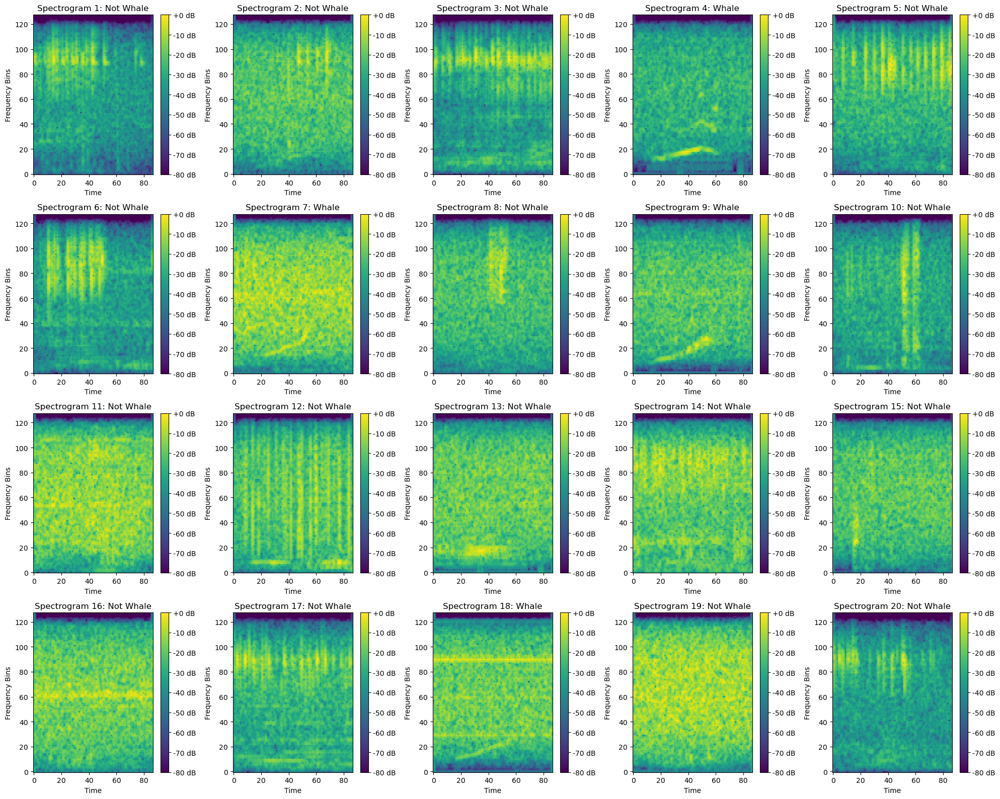

In [116]:
import random
import matplotlib.pyplot as plt

# Create a figure with 4 rows and 5 columns of subplots
fig, axes = plt.subplots(4, 5, figsize=(20, 16))  # Adjust figsize for better visibility

axes = axes.flatten()

for i in range(20):
    id = random.randint(0, 5000)  # Random index for selecting a sample
    spectrogram = X[0, id]  # Assuming X is a tensor with shape [1, n_samples, ...]
    ax = axes[i]
    cax = ax.imshow(spectrogram, aspect='auto', origin='lower', cmap='viridis')
    
    if y[id] == 1:
        ax.set_title(f'Spectrogram {i+1}: Whale')
    else:
        ax.set_title(f'Spectrogram {i+1}: Not Whale')
    
    ax.set_xlabel('Time')
    ax.set_ylabel('Frequency Bins')
    fig.colorbar(cax, ax=ax, format="%+2.0f dB")

plt.tight_layout()
plt.show()